# Setup

In [1]:
# Built-in
import copy
import gc
import shutil
import random
import os

# Torch
import torch.optim.lr_scheduler as lr_scheduler
import torch

# All around
from glob import glob
from ast import literal_eval
import librosa.feature
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from justshowit import show_grid_configurable

# Project specific
from helpers_general import get_path_valid_timestamp, MemoryLogger, epoch_plot, seed_everything
from sdxl_helpers import StableDiffusionTester, StableDiffusionHelper
from loss_functions import info_nce_loss
from models import ClipTextEncoder, AudioEncoder
from dataloaders import AudioTextPairDataLoader

# Suppress specific warning
import warnings
warnings.filterwarnings("ignore", message=".*Torch was not compiled with flash attention.*")
warnings.filterwarnings("ignore", message=".*clean_up_tokenization_spaces.*")
warnings.filterwarnings("ignore", message=".*enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True.*")
assert librosa.__version__ == '0.10.2.post1', "Had problems with librosa, to avoid complications ensure ´librosa.__version__==0.10.2.post1`"
warnings.filterwarnings("ignore", message=".*librosa.core.audio.__audioread_load.*")
warnings.filterwarnings("ignore", message=".*PySoundFile failed. Trying audioread instead.*")

# Files that will be saved for version control
SELF_PATHS =  glob(os.path.abspath("*"))
SELF_PATHS = [p.replace("\\", "/") for p in SELF_PATHS if (os.path.isfile(p))]
print("Files saved for version control: \n", [os.path.basename(p) for p in SELF_PATHS])

Files saved for version control: 
 ['clap_align_with_text_encoder.ipynb', 'clap_align_with_text_encoder_for_git.ipynb', 'dataloaders.py', 'helpers_general.py', 'inference_examples.ipynb', 'loss_functions.py', 'models.py', 'sdxl_helpers.py', 'simple_asserts.py', 'sound_augmentation.py']


# Configuration
Class `Config` controls everything (Dataset paths, model type, pre-trained weights, batch size, seed...).

In [2]:
class Config:
    # Control
    debug = False
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # TODO: Assert not multi-GPU setup
    run_validation_every_x_epoch = 2 if not debug else 1
    save_only_best_model = True
    use_f16_precision_for_songs = True # Save cached songs as f16, reduces size by 50% without much lose in quality.
    continue_form_loaded_optimizer = True
    continue_form_loaded_schedular = True 
    continue_form_loaded_epoch = True
    debug_guidance_scale = 30.0 
        
    # Paths - Predefined
    path_model_weights = os.path.abspath("../weights/pretrained.pth")
    assert (path_model_weights is None) or os.path.exists(path_model_weights), f"Bad path `{path_model_weights=}`"
    path_csv = os.path.abspath(f"../dataset/Dataset40k/dataset.csv")
    assert os.path.exists(path_csv), f"Bad path `{path_csv=}`"
    path_test_data = os.path.abspath(f"../dataset/Dataset40k/test_data")
    assert os.path.exists(path_test_data), f"Bad path `{path_test_data=}`"
    
    # Paths - Dataset (auto generated)
    path_cached_datasets = os.path.abspath("../dataset/Dataset40k/cached_data")
    os.makedirs(path_cached_datasets, exist_ok=True)
    assert os.path.exists(path_cached_datasets), f"Bad path `{path_cached_datasets=}`"
    path_cached_folder_song = os.path.abspath("../dataset/Dataset40k/song_cache")
    os.makedirs(path_cached_folder_song, exist_ok=True)
    assert os.path.exists(path_cached_folder_song), f"Bad path `{path_cached_folder_song=}`"
    path_cached_folder_clip_embeddings = os.path.abspath("../dataset/Dataset40k/text_embeddings")
    os.makedirs(path_cached_folder_clip_embeddings, exist_ok=True)
    assert os.path.exists(path_cached_folder_clip_embeddings), f"Bad path `{path_cached_folder_clip_embeddings=}`"

    # Paths - Debugging
    path_logging_all = os.path.abspath("../training_logs")
    os.makedirs(path_logging_all, exist_ok=True)
    assert os.path.exists(path_logging_all), f"Bad path `{path_logging_all=}`"
    path_logging_folder = os.path.abspath(f"{path_logging_all}/{get_path_valid_timestamp()}")
    os.makedirs(path_logging_folder, exist_ok=False)
    assert os.path.exists(path_logging_folder), f"Bad path `{path_logging_folder=}`"
    path_logging_debug_image_folder = os.path.abspath(f"{path_logging_folder}/debug_images")
    os.makedirs(path_logging_debug_image_folder, exist_ok=False)
    assert os.path.exists(path_logging_debug_image_folder), f"Bad path `{path_logging_debug_image_folder=}`"
    
    # Models
    model_audio_architecture = AudioEncoder
    model_text_architecture = ClipTextEncoder
    
    # Hypers - training
    batch_size = 100 if not debug else 10
    epochs = 400 if not debug else 2
    optimizer_hyper = dict(lr = 1e-4)
    optimizer = torch.optim.Adam
    min_learning_rate_possible = 1e-5
    scheduler_hyper = dict(T_max=epochs, eta_min=min_learning_rate_possible) # Hacky exponential decay LR
    scheduler = lr_scheduler.CosineAnnealingLR
    use_scheduler = False
    
    # Hypers - data
    # NOTE: The choice of these two variables drastically increase/decrease the VRAM/RAM required
    max_dataset_length = 1250 if not debug else (batch_size*4)
    number_of_prompts_per_song = 5
    assert 1 <= number_of_prompts_per_song <= 10, f"The dataset only contains 10 prompts per song"
    
    # Seed
    seed = 12
    seed_everything(seed)
    
    # Version control and debugging
    for self_path in SELF_PATHS:
        assert os.path.exists(self_path), self_path
        shutil.copy(self_path, f"{path_logging_folder}/{os.path.basename(self_path)}")
    # NOTE: I had a VRAM memory leak, I debugged it with `MemoryLogger` and fixed the problem, but kept the code for potential future debugging.
    memory_logger = MemoryLogger(f"{path_logging_folder}/memory_log.txt")
    print(f"Configuration successful. See logging at `{path_logging_folder}`")    
    
C = Config()

Configuration successful. See logging at `C:\Users\Jakob\Desktop\master-thesis-official\training_logs\2025-05-22-17-24-55-258308`


# Load data

In [3]:
df = pd.read_csv(C.path_csv)
columns_to_list = ["spotify_artists", "openai_prompts"]
for c in columns_to_list:
    df[c] = df[c].apply(literal_eval)

assert len(df["spotify_track_id"].unique()) == len(df)
assert df["path_audio_full"].apply(os.path.exists).all(), "Failed to find all song paths"
assert (df["openai_prompts"].apply(len) == 10).all(), "All prompt-collections most include exactly 10 prompts"
assert df["openai_prompts"].apply(lambda prompts: all([len(p.split(" "))>10 for p in prompts])).all(), \
    "Expected all individual prompts to be longer than 10 words (word = space separated)"

spotify_id_2_song_name = df.groupby("spotify_track_id").first()["spotify_track_name"].to_dict()
columns_subset = ["spotify_track_id", "spotify_valence", "spotify_energy", "spotify_genre", "openai_prompts", "youtube_duration_ms", "path_audio_full", "train_split"]
df = df[columns_subset]
len(df)

36342

# Cache text embeddings
The prompts remain unchanged since I'm not applying any text augmentation. 
This means that the embeddings can be precomputed once instead of recomputed for each batch.

In [ ]:
# Text encoder
text_encoder = C.model_text_architecture(C.device)
prompt = "Something something"
assert text_encoder(prompt).shape == (1, 77, 2048)

df["cache_clip_path"] = df["spotify_track_id"].apply(lambda p: f"{C.path_cached_folder_clip_embeddings}/{p}.npy")
for df_index, row in tqdm(df.iterrows(), total=len(df)):
    save_path = row["cache_clip_path"]
    if os.path.exists(save_path):
        continue

    prompts = row["openai_prompts"]
    prompts_embeddings = text_encoder(prompts)
    prompts_embeddings = prompts_embeddings.cpu().numpy()
    np.save(save_path, prompts_embeddings)

# Cache songs

In [ ]:
df["cache_song_path"] = df["spotify_track_id"].apply(lambda p: f"{C.path_cached_folder_song}/{p}.npy")
if C.use_f16_precision_for_songs:
    df["cache_song_path"] = df["cache_song_path"].apply(lambda p: p.replace(".npy", "_f16.npy"))
df["youtube_duration_seconds"] = df["youtube_duration_ms"] / 1000
df["d5"] = df["youtube_duration_seconds"] / 5
df["d5_duration"] = df["d5"]*3
EXPECTED_SAMPLE_LENGTH = 48_000 * 10
MAX_CLIP_LENGTH = EXPECTED_SAMPLE_LENGTH*6

raw_waveforms = []
for df_index, row in tqdm(df.iterrows(), total=len(df)):
    # Setup iteration
    audio_path = row["path_audio_full"]
    save_path = row["cache_song_path"]
    if C.use_f16_precision_for_songs:
        assert save_path.endswith("_f16.npy")
    if os.path.exists(save_path):
        continue

    # I'm going to split the audio clip into 5 segments and remove the first and the last i.e. keep the middle 3 segments
    try:
        raw_waveform, sr = librosa.load(audio_path, sr=48000, offset=row["d5"], duration=row["d5_duration"])
    except:
        print(f"Failed to d5-read song: {audio_path} - duration: {row['youtube_duration_seconds']}. Fall back to loading the whole song.")
        raw_waveform, sr = librosa.load(audio_path, sr=48000)

    # The number songs I can load into a single sub-batch is directly determined by the total cache-size of the song-clips.
    # I want a high number of unique songs in each sub-batch because this allows for greater positive-negative-pair variety.
    # But I would also like to keep necessary disk space manageable.
    # I'm therefor forced to limit the size of the song clips somehow.
    # I accomplished this by randomly picking 90 seconds clips if waveform > 90sec
    # This is obviously not ideal, but it was a trade-off between total cache-size and song-clip variety!
    waveform_length = raw_waveform.shape[0]
    if waveform_length > MAX_CLIP_LENGTH:
        start_index = random.randint(0, waveform_length-MAX_CLIP_LENGTH)
        end_index = start_index + MAX_CLIP_LENGTH
        raw_waveform = raw_waveform[start_index: end_index]
        assert raw_waveform.shape[0] == MAX_CLIP_LENGTH

    # Zero-pad raw_waveform to match expected_sample_length
    if EXPECTED_SAMPLE_LENGTH > raw_waveform.shape[0]:
        if raw_waveform.shape[0] < EXPECTED_SAMPLE_LENGTH:
            padding = EXPECTED_SAMPLE_LENGTH - raw_waveform.shape[0]
            raw_waveform = np.pad(raw_waveform, (0, padding), mode='constant')
    assert raw_waveform.shape[0] >= EXPECTED_SAMPLE_LENGTH, raw_waveform.shape

    # Save song as a f16/f32 numpy file
    cache_floating_point_precision = np.float16 if C.use_f16_precision_for_songs else np.float32
    np.save(save_path, raw_waveform.astype(cache_floating_point_precision))

# Split

In [6]:
print(df["train_split"].value_counts())
df_train = df[df['train_split'] == 'train'].reset_index()
df_valid = df[df['train_split'] == 'valid'].reset_index()
df_test =  df[df['train_split'] ==  'test'].reset_index()
if C.debug:
    df_train = df_train.iloc[:200].reset_index(drop=True)
    df_valid = df_valid.iloc[:100].reset_index(drop=True)
del df
len(df_train), len(df_valid), len(df_test)

train_split
train    29053
valid     7257
test        32
Name: count, dtype: int64


(29053, 7257, 32)

# Test setup 

In [7]:
sdxl_tester = StableDiffusionTester(C.path_test_data, text_encoder, guidance_scale=C.debug_guidance_scale)
del text_encoder
torch.cuda.empty_cache()
sd_helper = StableDiffusionHelper(spotify_id_2_song_name)

# Dataloaders

In [ ]:
# Train
print(f"{'_'*50}\nTRAIN\n{'_'*50}")
dataloader_train = AudioTextPairDataLoader(
    df_all=df_train, 
    batch_size=C.batch_size, 
    max_dataset_length=C.max_dataset_length, 
    shuffle=True, 
    cache_folder=C.path_cached_datasets, 
    dataset_type=f"{'DEBUG_' if C.debug else ''}train", 
    seed=C.seed, 
    number_of_prompts_per_song=C.number_of_prompts_per_song,
    do_info_nce_loss=True,
    do_augmentation=True,
)

# Valid
print(f"\n{'_'*50}\nVALID\n{'_'*50}")
dataloader_valid = AudioTextPairDataLoader(
    df_all=df_valid,
    batch_size=C.batch_size,
    max_dataset_length=C.max_dataset_length,
    shuffle=True,
    cache_folder=C.path_cached_datasets,
    dataset_type=f"{'DEBUG_' if C.debug else ''}valid",
    seed=C.seed,
    number_of_prompts_per_song=C.number_of_prompts_per_song,
    do_info_nce_loss=True,
    do_augmentation=False,
)

# Training

In [ ]:
# Initialize Audio encoder, Loss, optimizer, and scheduler
audio_encoder = C.model_audio_architecture().to(C.device)
optimizer = C.optimizer(audio_encoder.parameters(), **C.optimizer_hyper)
scheduler = C.scheduler(optimizer, **C.scheduler_hyper)
criterion = info_nce_loss

# Load from checkpoint if available
checkpoint = None
if C.path_model_weights:
    checkpoint = torch.load(C.path_model_weights) # ['epoch', 'model_state_dict', 'optimizer_state_dict', 'scheduler_state_dict', 'loss']
    print("Checkpoint epoch is : ", checkpoint["epoch"])
    audio_encoder.load_state_dict(checkpoint["model_state_dict"])
    if C.continue_form_loaded_optimizer:
        if (checkpoint["optimizer_state_dict"] is None):
            print("optimizer_state_dict is not defined. Fall back to the default optimizer.")
        else:
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    if C.continue_form_loaded_schedular:
        if (checkpoint["scheduler_state_dict"] is None):
            print("scheduler_state_dict is not defined. Fall back to the default scheduler.")
        else:
            scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    
# Sanity check
test_batch = copy.deepcopy(next(iter(dataloader_valid)))
with torch.no_grad():
    audio_embeddings = audio_encoder([*test_batch["waveform"].numpy()])
    print("Audio embeddings shaoe: ", audio_embeddings.shape)
    loss = criterion(audio_embeddings, test_batch["prompt_embeddings"], test_batch["negative_prompt_embeddings"])
    print("Loss: ", loss)
del test_batch, audio_embeddings, loss

In [10]:
stats = pd.DataFrame(np.zeros((C.epochs, 4)), columns=["train_loss", "valid_loss", "lr", "epoch"])
epoch_progress_bar = tqdm(range(C.epochs))

for epoch in epoch_progress_bar:
    #----------------------------------------------------------------------
    # Epoch setup
    #----------------------------------------------------------------------
    if checkpoint and (epoch <= checkpoint["epoch"]) and C.continue_form_loaded_epoch:
        valid_losses = np.zeros(len(dataloader_valid))
        continue
    is_validation_epoch = (epoch % C.run_validation_every_x_epoch == 0) or (epoch+1 == C.epochs)
    train_losses = np.zeros(len(dataloader_train))
    if is_validation_epoch:
        valid_losses = np.zeros(len(dataloader_valid))


    #----------------------------------------------------------------------
    # Train
    #----------------------------------------------------------------------
    audio_encoder.train()
    for i, batch in enumerate(tqdm(dataloader_train, leave=False)):
        # Forward pass
        try:
            audio_embeddings = audio_encoder([*batch["waveform"].numpy()]) # TODO
        except Exception as e:
            print(f"Train exception at batch `{i}`: {e}")
            continue
        loss = criterion(audio_embeddings, batch["prompt_embeddings"], batch["negative_prompt_embeddings"])

        # Backward pass
        loss.backward()

        # Batch update and logging
        optimizer.step()
        optimizer.zero_grad()
        train_losses[i] = loss.detach().cpu().item()
        progress_info = {"train_avg": f"{(round(train_losses[:i].mean(), 3) if i else 0.0):05.3f}"}
        epoch_progress_bar.set_postfix(progress_info)
        C.memory_logger({"epoch":epoch, **progress_info})

    # Train debug images
    sd_helper.load_pipeline()
    sd_helper.batch_2_video(batch, audio_embeddings, C.path_logging_debug_image_folder, 
                            C.debug_guidance_scale, prefix=f"{epoch}_train", number_of_images=min(len(batch), 20))
    sd_helper.clear_pipeline()


    #----------------------------------------------------------------------
    # Validation
    #----------------------------------------------------------------------
    if is_validation_epoch:
        audio_encoder.eval()
        for i, batch in enumerate(tqdm(dataloader_valid, leave=False)):

            # Forward pass
            with torch.no_grad():
                try:
                    audio_embeddings = audio_encoder([*batch["waveform"].numpy()]) # TODO:
                except Exception as e:
                    print(f"Valid exception at batch `{i}`: {e}")
                    continue
            loss = criterion(audio_embeddings, batch["prompt_embeddings"], batch["negative_prompt_embeddings"])

            # Batch update and logging
            valid_losses[i] = loss.detach().cpu().item()
            progress_info = {"valid_avg": f"{(round(valid_losses[:i].mean(), 3) if i else 0.0):05.3f}"}
            epoch_progress_bar.set_postfix(progress_info)
            C.memory_logger({"epoch":epoch, **progress_info})

        # Valid and test debug images
        sd_helper.load_pipeline()
        sd_helper.batch_2_video(batch, audio_embeddings, C.path_logging_debug_image_folder, 
                                C.debug_guidance_scale, prefix=f"{epoch}_valid", number_of_images=min(len(batch), 20))
        sd_helper.clear_pipeline()
        sdxl_tester.generate_images_from_audio_encoder(audio_encoder, 32)
        sdxl_tester.save_images_to_disk(C.path_logging_debug_image_folder, f"{epoch}_test")


    #----------------------------------------------------------------------
    # End of epoch update
    #----------------------------------------------------------------------
    if C.use_scheduler:
        scheduler.step()
    torch.cuda.empty_cache()
    gc.collect()
    del batch

    # Save epoch stats
    stats.iloc[epoch] = [train_losses.mean(), valid_losses.mean(), optimizer.param_groups[0]['lr'], epoch]
    epoch_plot(stats, C.path_logging_folder, epoch)

    # Just in case
    torch.save({
        'epoch': epoch,
        'model_state_dict': audio_encoder.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': loss
    }, f"{C.path_logging_folder}/last_{epoch}.pth")

    # Save models
    if (epoch > 0) and (stats["valid_loss"][epoch] < stats.loc[:(epoch-1) ,"valid_loss"].min()): # Save model if it's better
        try:
            torch.save({    
                'epoch': epoch,
                'model_state_dict': audio_encoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(), 
                'scheduler_state_dict': scheduler.state_dict(),
                'loss': loss
            }, f"{C.path_logging_folder}/best.pth")
            print("Saved successfully: ", epoch)                                                                            
        except Exception as e:
            print("Saved failed: ", e)

# Generate final images for the test set

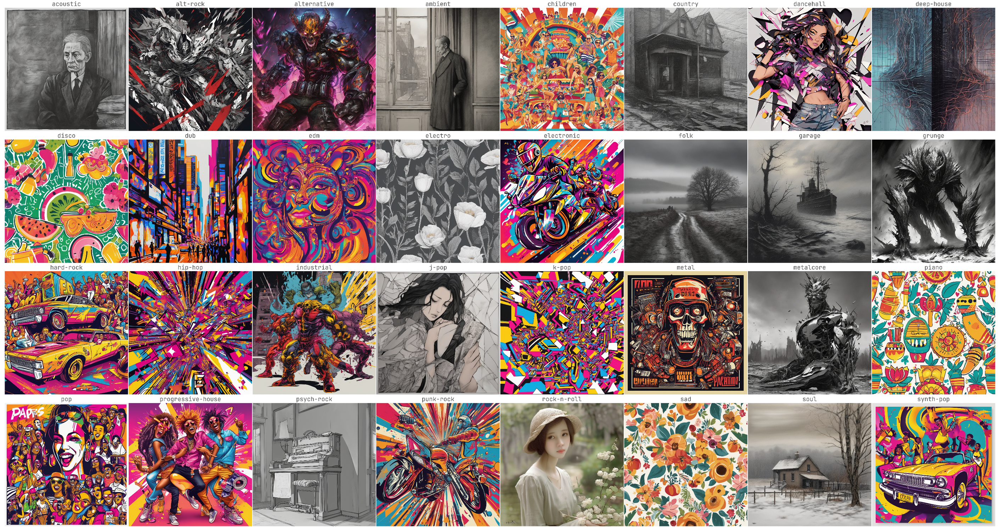

In [11]:
# audio_encoder.eval()
seed_everything(42)
sdxl_tester.guidance_scale = 40.0 # You can play around with this as you like. 
sdxl_tester.generate_images_from_audio_encoder(audio_encoder, 32)
sdxl_tester.save_images_to_disk(C.path_logging_debug_image_folder, f"FINAL_test")
show_grid_configurable(
    sdxl_tester.song_generated_images,
    image_text=sdxl_tester.df["spotify_genre"].tolist(),
    c_image_text_config = {
        'placement': 'title_middle', 
        'font_size': 50, 
        'font_thickness': 3, 
        'italic': False, 
        'color': (75, 75, 75), 
        'adjust_draw_distance': None
    },
    c_image_area_margins = {"left": 40, "right":40, "top":65, "bottom":40},
    save_image_path = f"{C.path_logging_debug_image_folder}/FINAL_test.jpg",
    max_output_image_size_wh=(3000, 1500)
)

# Generate song/image videos from validation batches

In [ ]:
sd_helper.load_pipeline()
audio_encoder.eval()

with torch.no_grad():
    for i, valid_batch in enumerate(tqdm(dataloader_valid, leave=False)):
        valid_audio_embeddings = audio_encoder([*valid_batch["waveform"].numpy()])

        for j in [30.0, 50.0, 100.0]:
            sd_helper.batch_2_video(valid_batch, valid_audio_embeddings, C.path_logging_debug_image_folder, j, prefix=f"FINAL_valid_{i}_{int(j)}", number_of_images=len(valid_audio_embeddings))
            
        break # TODO: A single batch takes ~5 min on a good PC. Remove this if you want to do the whole dataset, but it will take a long time.
sd_helper.clear_pipeline()